In [270]:
import random
import copy
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from tqdm import tqdm

seed = 449
random.seed(seed)
torch.manual_seed(seed)

In [271]:
batch_size = 128
image_size = 32
nc = 3      # number of channels in training image
nz = 64    # latent vector size

# size of feature maps in generator and discriminator
ngf = 64
ndf = 64

num_epochs = 64
lr = 0.0002
beta1 = 0.5
ngpu = 1
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)

cuda:0


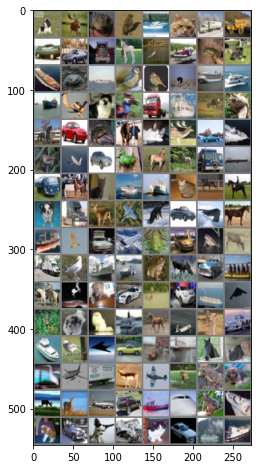

In [272]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=False, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=False, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# functions to show an image
def imshow(img, animated=False):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimg, (1, 2, 0)), animated=animated)
    plt.show()

dataiter = iter(trainloader)
images, labels = next(dataiter)

imshow(torchvision.utils.make_grid(images))
# print(' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))

In [273]:
# custom weights init from DCGAN paper
# TODO: try other initializations too
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [274]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.net = nn.Sequential(
            # nc x 32 x 32 input
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*2 x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # ndf*4 x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, input):
        return self.net(input)

In [275]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.net = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 4 x 4``
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 8 x 8``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 16 x 16``
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 32 x 32``
        )

    def forward(self, x):
        return self.net(x)


In [276]:
netD = Discriminator(ngpu).to(device)
netD.apply(weights_init)

images, labels = next(dataiter)
images = images.to(device)
output = netD(images)
print(output[0])

tensor([[[0.2438]]], device='cuda:0', grad_fn=<SelectBackward0>)


torch.Size([128, 64, 1, 1])
torch.Size([128, 3, 32, 32])


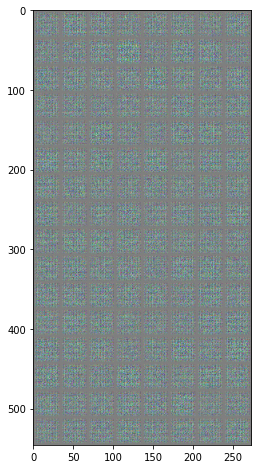

In [277]:
netG = Generator(ngpu).to(device)
netG.apply(weights_init)

noise = torch.randn(batch_size, nz, 1, 1, device=device)
print(noise.shape)
fakes = netG(noise)
fakes = fakes.cpu()
print(fakes.shape)

imshow(torchvision.utils.make_grid(fakes))

In [278]:
img_list = []
G_losses = []
D_losses = []
saved_gens = [copy.deepcopy(netG)]
gen_min = 0

lossG_min = 999

iters = 0

real = 1.
fake = 0.

loss_fn = nn.BCELoss()
fixed_noise = torch.randn(32, nz, 1, 1, device=device)
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

for epoch in tqdm(range(num_epochs)):
    for i, data in enumerate(trainloader):
        ################################
        # Update Discriminator
        netD.zero_grad()
        images = data[0].to(device)
        b_size = images.shape[0]
        labels = torch.full((b_size,), real, dtype=torch.float, device=device)

        # Discriminator with real images
        output = netD(images).view(-1)
        lossD_real = loss_fn(output, labels)
        lossD_real.backward()
        D_x = output.mean().item()

        # Generate fake images
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fakes = netG(noise)
        labels.fill_(fake)
        
        # Classify fakes with Discriminator
        output = netD(fakes.detach()).view(-1)
        lossD_fake = loss_fn(output, labels)
        lossD_fake.backward()
        D_G_z1 = output.mean().item()

        lossD = lossD_real + lossD_fake
        optimizerD.step()
        ################################
        # Update Generator
        netG.zero_grad()
        labels.fill_(real)

        # Classify fakes with updated Discriminator
        output = netD(fakes).view(-1)
        lossG = loss_fn(output, labels)
        lossG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if (lossG.item() < lossG_min):
            gen_min = copy.deepcopy(netG)

        # Training Stats
        if iters % 500 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(trainloader),
                     lossD.item(), lossG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(lossG.item())
        D_losses.append(lossD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                generated = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(generated))
            saved_gens.append(copy.deepcopy(netG))
        iters += 1

  0%|          | 0/64 [00:00<?, ?it/s]

[0/64][0/391]	Loss_D: 1.6548	Loss_G: 2.1198	D(x): 0.4201	D(G(z)): 0.4652 / 0.1437


  2%|▏         | 1/64 [00:11<11:52, 11.32s/it]

[1/64][109/391]	Loss_D: 0.3333	Loss_G: 3.9384	D(x): 0.8687	D(G(z)): 0.1526 / 0.0297


  3%|▎         | 2/64 [00:22<11:31, 11.15s/it]

[2/64][218/391]	Loss_D: 0.3170	Loss_G: 3.4404	D(x): 0.8525	D(G(z)): 0.1279 / 0.0450


  5%|▍         | 3/64 [00:33<11:18, 11.12s/it]

[3/64][327/391]	Loss_D: 0.6891	Loss_G: 4.8811	D(x): 0.9381	D(G(z)): 0.4084 / 0.0132


  8%|▊         | 5/64 [00:55<10:52, 11.07s/it]

[5/64][45/391]	Loss_D: 0.4820	Loss_G: 2.6240	D(x): 0.8405	D(G(z)): 0.2405 / 0.0923


  9%|▉         | 6/64 [01:06<10:38, 11.01s/it]

[6/64][154/391]	Loss_D: 0.7312	Loss_G: 2.0529	D(x): 0.6512	D(G(z)): 0.1974 / 0.1625


 11%|█         | 7/64 [01:17<10:30, 11.07s/it]

[7/64][263/391]	Loss_D: 0.4310	Loss_G: 2.4019	D(x): 0.8008	D(G(z)): 0.1548 / 0.1265


 12%|█▎        | 8/64 [01:28<10:21, 11.10s/it]

[8/64][372/391]	Loss_D: 0.5049	Loss_G: 2.0056	D(x): 0.7847	D(G(z)): 0.2068 / 0.1604


 16%|█▌        | 10/64 [01:50<09:56, 11.06s/it]

[10/64][90/391]	Loss_D: 0.8622	Loss_G: 1.4688	D(x): 0.5299	D(G(z)): 0.1183 / 0.2775


 17%|█▋        | 11/64 [02:01<09:46, 11.07s/it]

[11/64][199/391]	Loss_D: 0.7194	Loss_G: 3.3069	D(x): 0.9319	D(G(z)): 0.4434 / 0.0481


 19%|█▉        | 12/64 [02:13<09:41, 11.18s/it]

[12/64][308/391]	Loss_D: 0.5722	Loss_G: 1.9207	D(x): 0.7436	D(G(z)): 0.2069 / 0.1834


 22%|██▏       | 14/64 [02:35<09:23, 11.27s/it]

[14/64][26/391]	Loss_D: 3.5115	Loss_G: 5.5171	D(x): 0.9883	D(G(z)): 0.9429 / 0.0091


 23%|██▎       | 15/64 [02:47<09:12, 11.27s/it]

[15/64][135/391]	Loss_D: 0.8494	Loss_G: 1.3796	D(x): 0.5503	D(G(z)): 0.1457 / 0.2909


 25%|██▌       | 16/64 [02:58<09:01, 11.29s/it]

[16/64][244/391]	Loss_D: 0.8354	Loss_G: 2.0520	D(x): 0.8000	D(G(z)): 0.4172 / 0.1570


 27%|██▋       | 17/64 [03:09<08:50, 11.29s/it]

[17/64][353/391]	Loss_D: 0.9180	Loss_G: 1.3107	D(x): 0.5204	D(G(z)): 0.1689 / 0.3171


 30%|██▉       | 19/64 [03:32<08:25, 11.23s/it]

[19/64][71/391]	Loss_D: 0.8266	Loss_G: 1.7326	D(x): 0.6943	D(G(z)): 0.3229 / 0.2068


 31%|███▏      | 20/64 [03:43<08:11, 11.17s/it]

[20/64][180/391]	Loss_D: 0.4861	Loss_G: 2.6344	D(x): 0.8752	D(G(z)): 0.2775 / 0.0957


 33%|███▎      | 21/64 [03:54<07:57, 11.09s/it]

[21/64][289/391]	Loss_D: 0.7692	Loss_G: 1.5314	D(x): 0.7026	D(G(z)): 0.3026 / 0.2466


 36%|███▌      | 23/64 [04:16<07:33, 11.06s/it]

[23/64][7/391]	Loss_D: 0.4973	Loss_G: 2.0907	D(x): 0.7474	D(G(z)): 0.1603 / 0.1499


 38%|███▊      | 24/64 [04:27<07:19, 10.99s/it]

[24/64][116/391]	Loss_D: 0.9955	Loss_G: 1.0299	D(x): 0.4562	D(G(z)): 0.1032 / 0.4238


 39%|███▉      | 25/64 [04:38<07:10, 11.03s/it]

[25/64][225/391]	Loss_D: 0.6496	Loss_G: 1.7001	D(x): 0.6928	D(G(z)): 0.2098 / 0.2153


 41%|████      | 26/64 [04:49<06:59, 11.04s/it]

[26/64][334/391]	Loss_D: 0.8490	Loss_G: 3.5388	D(x): 0.9078	D(G(z)): 0.4746 / 0.0408


 44%|████▍     | 28/64 [05:11<06:38, 11.06s/it]

[28/64][52/391]	Loss_D: 0.8030	Loss_G: 1.1922	D(x): 0.6206	D(G(z)): 0.2260 / 0.3426


 45%|████▌     | 29/64 [05:22<06:24, 10.97s/it]

[29/64][161/391]	Loss_D: 0.5187	Loss_G: 1.6564	D(x): 0.7532	D(G(z)): 0.1766 / 0.2400


 47%|████▋     | 30/64 [05:33<06:13, 10.98s/it]

[30/64][270/391]	Loss_D: 0.6051	Loss_G: 1.8113	D(x): 0.6946	D(G(z)): 0.1806 / 0.2103


 48%|████▊     | 31/64 [05:44<06:02, 11.00s/it]

[31/64][379/391]	Loss_D: 0.7191	Loss_G: 1.5861	D(x): 0.6423	D(G(z)): 0.1756 / 0.2351


 52%|█████▏    | 33/64 [06:06<05:40, 10.99s/it]

[33/64][97/391]	Loss_D: 0.7334	Loss_G: 2.0328	D(x): 0.7591	D(G(z)): 0.3196 / 0.1635


 53%|█████▎    | 34/64 [06:17<05:28, 10.95s/it]

[34/64][206/391]	Loss_D: 0.5020	Loss_G: 1.9956	D(x): 0.7474	D(G(z)): 0.1549 / 0.1750


 55%|█████▍    | 35/64 [06:28<05:22, 11.13s/it]

[35/64][315/391]	Loss_D: 0.7176	Loss_G: 1.8756	D(x): 0.6916	D(G(z)): 0.2527 / 0.1882


 58%|█████▊    | 37/64 [06:51<05:05, 11.30s/it]

[37/64][33/391]	Loss_D: 0.6214	Loss_G: 2.4832	D(x): 0.8071	D(G(z)): 0.3015 / 0.1119


 59%|█████▉    | 38/64 [07:03<04:55, 11.35s/it]

[38/64][142/391]	Loss_D: 0.4751	Loss_G: 2.1242	D(x): 0.7357	D(G(z)): 0.1239 / 0.1678


 61%|██████    | 39/64 [07:14<04:45, 11.40s/it]

[39/64][251/391]	Loss_D: 0.7354	Loss_G: 1.4446	D(x): 0.6926	D(G(z)): 0.2418 / 0.2894


 62%|██████▎   | 40/64 [07:25<04:33, 11.40s/it]

[40/64][360/391]	Loss_D: 0.9127	Loss_G: 3.1964	D(x): 0.9113	D(G(z)): 0.4936 / 0.0604


 66%|██████▌   | 42/64 [07:48<04:10, 11.39s/it]

[42/64][78/391]	Loss_D: 0.6183	Loss_G: 1.3768	D(x): 0.6406	D(G(z)): 0.1048 / 0.3025


 67%|██████▋   | 43/64 [07:59<03:56, 11.25s/it]

[43/64][187/391]	Loss_D: 0.4516	Loss_G: 2.5255	D(x): 0.7990	D(G(z)): 0.1759 / 0.1106


 69%|██████▉   | 44/64 [08:10<03:43, 11.19s/it]

[44/64][296/391]	Loss_D: 1.6598	Loss_G: 6.1963	D(x): 0.9150	D(G(z)): 0.7049 / 0.0048


 72%|███████▏  | 46/64 [08:32<03:19, 11.11s/it]

[46/64][14/391]	Loss_D: 0.5345	Loss_G: 2.3255	D(x): 0.8173	D(G(z)): 0.2490 / 0.1367


 73%|███████▎  | 47/64 [08:43<03:07, 11.03s/it]

[47/64][123/391]	Loss_D: 1.2858	Loss_G: 3.1103	D(x): 0.8488	D(G(z)): 0.5856 / 0.0869


 75%|███████▌  | 48/64 [08:54<02:56, 11.02s/it]

[48/64][232/391]	Loss_D: 0.3596	Loss_G: 2.5960	D(x): 0.8137	D(G(z)): 0.1204 / 0.1054


 77%|███████▋  | 49/64 [09:05<02:45, 11.03s/it]

[49/64][341/391]	Loss_D: 0.8545	Loss_G: 1.9342	D(x): 0.6681	D(G(z)): 0.2591 / 0.1974


 80%|███████▉  | 51/64 [09:27<02:24, 11.09s/it]

[51/64][59/391]	Loss_D: 0.3660	Loss_G: 3.3285	D(x): 0.9376	D(G(z)): 0.2318 / 0.0546


 81%|████████▏ | 52/64 [09:38<02:11, 11.00s/it]

[52/64][168/391]	Loss_D: 0.4121	Loss_G: 2.0560	D(x): 0.7722	D(G(z)): 0.1149 / 0.1665


 83%|████████▎ | 53/64 [09:49<02:01, 11.00s/it]

[53/64][277/391]	Loss_D: 1.4852	Loss_G: 0.2518	D(x): 0.3232	D(G(z)): 0.0381 / 0.8137


 84%|████████▍ | 54/64 [10:00<01:49, 10.98s/it]

[54/64][386/391]	Loss_D: 0.4533	Loss_G: 3.0181	D(x): 0.8476	D(G(z)): 0.2164 / 0.0736


 88%|████████▊ | 56/64 [10:22<01:27, 11.00s/it]

[56/64][104/391]	Loss_D: 0.4123	Loss_G: 2.3793	D(x): 0.7815	D(G(z)): 0.1219 / 0.1325


 89%|████████▉ | 57/64 [10:33<01:16, 10.98s/it]

[57/64][213/391]	Loss_D: 0.3949	Loss_G: 2.5970	D(x): 0.8214	D(G(z)): 0.1525 / 0.1100


 91%|█████████ | 58/64 [10:44<01:06, 11.02s/it]

[58/64][322/391]	Loss_D: 0.3381	Loss_G: 2.4707	D(x): 0.8093	D(G(z)): 0.0973 / 0.1203


 94%|█████████▍| 60/64 [11:06<00:44, 11.03s/it]

[60/64][40/391]	Loss_D: 0.2401	Loss_G: 3.0713	D(x): 0.9052	D(G(z)): 0.1179 / 0.0710


 95%|█████████▌| 61/64 [11:17<00:32, 10.99s/it]

[61/64][149/391]	Loss_D: 0.4231	Loss_G: 3.2566	D(x): 0.9090	D(G(z)): 0.2404 / 0.0615


 97%|█████████▋| 62/64 [11:28<00:22, 11.04s/it]

[62/64][258/391]	Loss_D: 0.4213	Loss_G: 2.9733	D(x): 0.8567	D(G(z)): 0.1982 / 0.0789


 98%|█████████▊| 63/64 [11:39<00:11, 11.03s/it]

[63/64][367/391]	Loss_D: 0.4392	Loss_G: 2.4539	D(x): 0.7804	D(G(z)): 0.1263 / 0.1310


100%|██████████| 64/64 [11:50<00:00, 11.11s/it]


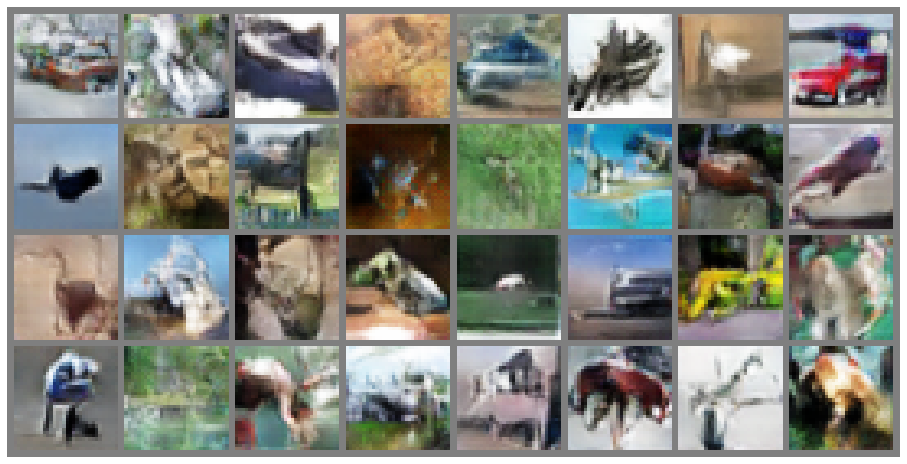

In [279]:
# for img in img_list:
#     imshow(img)

fig = plt.figure(figsize=(16,16))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i/2 + 0.5,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

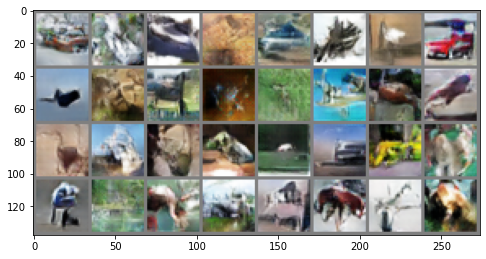

In [280]:
out = gen_min(fixed_noise).cpu()

imshow(torchvision.utils.make_grid(out))